Import libraries and Data

In [282]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objs as go

Data = pd.read_csv('Data/Q3.csv')

Look at how is data formed

In [283]:
Data.describe()

,disc_number,duration_ms,popularity,track_number,album_total_tracks,album_release_year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,10632.000000,1.063200e+04,931.000000,10632.000000,931.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000
mean,1.069225,2.888011e+05,20.113856,5.576279,9.707841,1981.687453,0.510869,0.496408,5.205982,-10.070847,0.373965,0.069843,0.609586,0.127399,0.193231,0.450537,119.381223,3.666384
std,0.386374,1.695220e+05,10.415865,4.533367,6.744375,232.376793,0.172341,0.241768,3.635221,4.605740,0.483877,0.071078,0.317795,0.284277,0.154764,0.239068,29.831699,0.637143
min,1.000000,3.996000e+03,0.000000,1.000000,1.000000,0.000000,0.000000,0.000975,0.000000,-37.404000,0.000000,0.000000,0.000022,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,2.035690e+05,13.000000,2.000000,5.000000,2005.000000,0.372000,0.298000,2.000000,-12.665750,0.000000,0.036100,0.332000,0.000000,0.095800,0.256750,95.114750,3.000000
50%,1.000000,2.536180e+05,20.000000,5.000000,10.000000,2010.000000,0.497000,0.489000,5.000000,-9.067000,0.000000,0.044900,0.725000,0.000088,0.133000,0.421000,120.076000,4.000000
75%,1.000000,3.337745e+05,28.000000,8.000000,12.000000,2016.000000,0.652000,0.693000,9.000000,-6.617750,1.000000,0.067225,0.882000,0.014900,0.250000,0.633000,138.032000,4.000000
max,4.000000,3.978450e+06,48.000000,32.000000,55.000000,2020.000000,0.964000,0.998000,11.000000,-0.626000,1.000000,0.939000,0.996000,0.995000,0.992000,0.980000,219.960000,5.000000


In [284]:
print(Data)

                     track_id  disc_number  duration_ms  explicit  \
0      31iPeC6I0AiRW8InOxNKzm            1       446880     False   
1      4Fi46ha8teWYTwk0b8fNPi            1       851920     False   
2      0lQAe6EslKA7CUsS7SCW6Q            1       293160     False   
3      6dAFmJdVsKk5ksCpGqnKgO            1       648720     False   
4      4VSDJGyEdSMB8UL4fDSCvv            1       273480     False   
...                       ...          ...          ...       ...   
10627  4pEbf7VQrO4StzbqdFOnr5            1       397505     False   
10628  6umKGf6TO7aRXvJWkP6WSy            1      3522173     False   
10629  5KiMQApCqUVNObTO004MWI            1      3402706     False   
10630  4w1VKm2kjmA2Xz4YSMBfIn            1      3342733     False   
10631  2e4KeWR0Ym9CTBrSG08FSc            1       530920     False   

                             track_name   track_name_farsi     artist_name  \
0                          Ghazale Taze                NaN    Salar Aghili   
1              

Evaluate column's the values
More than 9000 missing values will be deleted

In [285]:
for i in Data.columns.values:
    if Data[i].isnull().sum() > 0:
        print(i)
        print(Data[i].isnull().sum())
        print(Data[i].notna().sum())

track_name_farsi
10020
612
popularity
9701
931
album_href
9701
931
album_total_tracks
9701
931
key_name
144
10488
mode_name
144
10488
key_mode
144
10488


These three ones have little missing value ,we find mode for them to apply on missing values

In [286]:
print('mode_name',Data['mode_name'].mode())
print('key_mode',Data['key_mode'].mode())
print('key_name',Data['key_name'].mode())

print('mode_name',Data['mode_name'].unique())
print(len(Data['mode_name'].unique()))
print('key_name',Data['key_name'].unique())
print(len(Data['key_name'].unique()))

mode_name 0    minor
dtype: object
key_mode 0    A minor
dtype: object
key_name 0    C
dtype: object
mode_name ['minor' 'major' nan]
3
key_name ['C' 'F' 'D' 'F#' 'A' 'G' 'G#' 'E' 'B' 'A#' 'C#' 'D#' nan]
13


- Delete those columns with useless data like track_id ,album_id and album_href 
- Delete columns which have less than 1000 value
- Delete key_mode repetitive values
- Apply mode on key_name and mode_name
- album_id, track_href, track_id, album_href useless values
- album_release_year, artist_name_farsi, track_name_farsi repetitive column values
- artist_name_farsi, popularity, album_total_tracks missing huge amount of values

In [287]:
Data = Data.drop(columns= ['album_id'])
Data = Data.drop(columns= ['key_mode'])
Data = Data.drop(columns= ['album_release_year'])
Data = Data.drop(columns= ['popularity'])
Data = Data.drop(columns= ['artist_name_farsi'])
Data = Data.drop(columns= ['track_href'])
Data = Data.drop(['track_name_farsi'], axis=1)
Data = Data.drop(['album_total_tracks'], axis=1)
Data = Data.drop(['track_id'], axis=1)
Data = Data.drop(['album_href'], axis=1)
Data['mode_name'] = Data['mode_name'].replace(to_replace = np.nan, value = 'minor')
Data['key_name'] = Data['key_name'].replace(to_replace = np.nan, value = 'C')

In [288]:
Data.describe()

,disc_number,duration_ms,track_number,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,10632.000000,1.063200e+04,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000
mean,1.069225,2.888011e+05,5.576279,0.510869,0.496408,5.205982,-10.070847,0.373965,0.069843,0.609586,0.127399,0.193231,0.450537,119.381223,3.666384
std,0.386374,1.695220e+05,4.533367,0.172341,0.241768,3.635221,4.605740,0.483877,0.071078,0.317795,0.284277,0.154764,0.239068,29.831699,0.637143
min,1.000000,3.996000e+03,1.000000,0.000000,0.000975,0.000000,-37.404000,0.000000,0.000000,0.000022,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,2.035690e+05,2.000000,0.372000,0.298000,2.000000,-12.665750,0.000000,0.036100,0.332000,0.000000,0.095800,0.256750,95.114750,3.000000
50%,1.000000,2.536180e+05,5.000000,0.497000,0.489000,5.000000,-9.067000,0.000000,0.044900,0.725000,0.000088,0.133000,0.421000,120.076000,4.000000
75%,1.000000,3.337745e+05,8.000000,0.652000,0.693000,9.000000,-6.617750,1.000000,0.067225,0.882000,0.014900,0.250000,0.633000,138.032000,4.000000
max,4.000000,3.978450e+06,32.000000,0.964000,0.998000,11.000000,-0.626000,1.000000,0.939000,0.996000,0.995000,0.992000,0.980000,219.960000,5.000000


In [289]:
Data.columns

Index(['disc_number', 'duration_ms', 'explicit', 'track_name', 'artist_name',
       'track_number', 'album_name', 'album_release_date', 'danceability',
       'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'key_name', 'mode_name'],
      dtype='object')

In [290]:
len(Data.columns)

22

Evaluate 'album_release_date' for what kind of data in it, so there is no nan and zero values there are only years without any dates

In [291]:
ss = set()
for i in Data['album_release_date'].values:
    ss.add(i)

for i in ss:
    if i == 0:
        print(i)

Split 'album_release_date' to year, month and day columns

In [292]:
import random

alreda = Data['album_release_date'].values
year = []
month = []
day = []
random.seed(98)
for i in alreda:
    tmp = i.split('-')
    if len(tmp) == 1:
        if tmp[0] == year[-1]:
            year.append(int(tmp[0]))
            month.append(int(month[-1]))
            day.append(int(day[-1]))
        else:
            year.append(int(tmp[0]))
            month.append(random.randint(1,12))
            day.append(random.randint(1,30))
    else:
        year.append(int(tmp[0]))
        month.append(int(tmp[1]))
        day.append(int(tmp[2]))
Data['album_release_year'] = year
Data['album_release_month'] = month
Data['album_release_day'] = day
Data = Data.drop(columns= ['album_release_date'])

In [293]:
Data.columns

Index(['disc_number', 'duration_ms', 'explicit', 'track_name', 'artist_name',
       'track_number', 'album_name', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature', 'key_name',
       'mode_name', 'album_release_year', 'album_release_month',
       'album_release_day'],
      dtype='object')

No missing values, categoricals first and numericals at last, it is ready to encoding

In [294]:
Data.describe()

,disc_number,duration_ms,track_number,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,album_release_year,album_release_month,album_release_day
count,10632.000000,1.063200e+04,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000,10632.000000
mean,1.069225,2.888011e+05,5.576279,0.510869,0.496408,5.205982,-10.070847,0.373965,0.069843,0.609586,0.127399,0.193231,0.450537,119.381223,3.666384,2008.937265,6.343209,13.517682
std,0.386374,1.695220e+05,4.533367,0.172341,0.241768,3.635221,4.605740,0.483877,0.071078,0.317795,0.284277,0.154764,0.239068,29.831699,0.637143,8.694986,3.434330,8.752326
min,1.000000,3.996000e+03,1.000000,0.000000,0.000975,0.000000,-37.404000,0.000000,0.000000,0.000022,0.000000,0.000000,0.000000,0.000000,0.000000,1974.000000,1.000000,1.000000
25%,1.000000,2.035690e+05,2.000000,0.372000,0.298000,2.000000,-12.665750,0.000000,0.036100,0.332000,0.000000,0.095800,0.256750,95.114750,3.000000,2005.000000,3.000000,6.000000
50%,1.000000,2.536180e+05,5.000000,0.497000,0.489000,5.000000,-9.067000,0.000000,0.044900,0.725000,0.000088,0.133000,0.421000,120.076000,4.000000,2011.000000,6.000000,13.000000
75%,1.000000,3.337745e+05,8.000000,0.652000,0.693000,9.000000,-6.617750,1.000000,0.067225,0.882000,0.014900,0.250000,0.633000,138.032000,4.000000,2016.000000,9.000000,21.000000
max,4.000000,3.978450e+06,32.000000,0.964000,0.998000,11.000000,-0.626000,1.000000,0.939000,0.996000,0.995000,0.992000,0.980000,219.960000,5.000000,2020.000000,12.000000,31.000000


For each categorical column we should see if it is ok to use OneHotEncoder, for versatile values is not good approach
- for 'explicit' we have 2 kind of values so it is ok
- for 'track_name' we have 7586 values, so it is not ok, more looks like an id to each column, it will be delete
- for 'artist_name' there are 69, it is so much
- for 'album_name' also it is 2097 so we cant use it, it will be deleted or used with label encoding
- for 'key_name','mode_name','key_mode' only for key_mode it is alittle bit alot (24 types of value) but it is ok

In [295]:
ss = set()
# 'explicit', 'track_name','artist_name','album_name','key_name','mode_name','key_mode'
for i in Data['album_name'].values:
    ss.add(i)
# print(len(ss))
# print(ss)

Delete track_name and album_name dont have much affect on learning cz almost have versatile values for each row

In [296]:
Data = Data.drop(columns= ['album_name'])
Data = Data.drop(columns= ['track_name'])

- Before feature scaling we should see we can use normalisation or standardisation
- So now we check if our data ditribution is normal or not
- we can see that some of them are normal while some columns are not, so we use standardisation

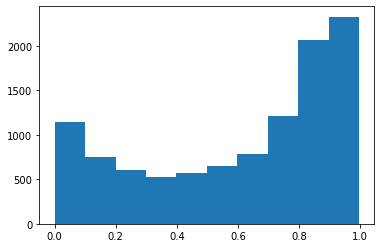

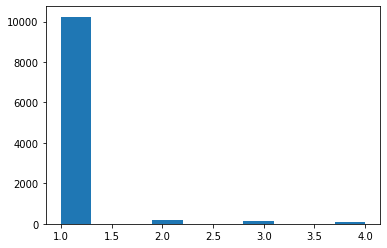

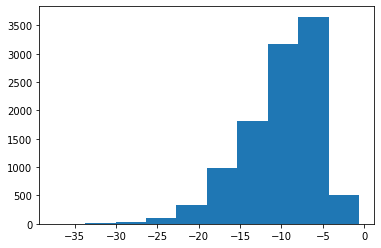

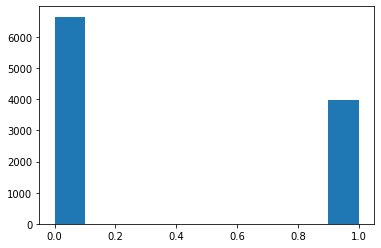

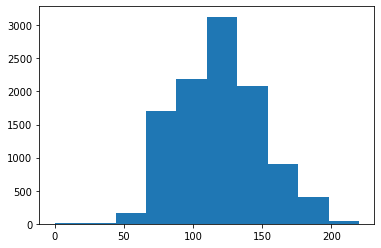

In [297]:
plt.hist(Data['acousticness'])
plt.show()
plt.hist(Data['disc_number'])
plt.show()
plt.hist(Data['loudness'])
plt.show()
plt.hist(Data['mode'])
plt.show()
plt.hist(Data['tempo'])
plt.show()
#        'disc_number', 'duration_ms', 'track_number',
#        'danceability', 'key', 'loudness', 'mode', 'speechiness',
#        'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
#        'time_signature', 'energy', 'album_release_year', 'album_release_month',
#        'album_release_day'],

Rearrenging our columns so put categorical data first then numerical and y column which is 'energy' in the last

In [298]:
Data.columns

Index(['disc_number', 'duration_ms', 'explicit', 'artist_name', 'track_number',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'key_name', 'mode_name', 'album_release_year',
       'album_release_month', 'album_release_day'],
      dtype='object')

In [299]:
len(Data.columns)

22

Rearrenging column for next states

In [300]:
Data = Data[['explicit','mode_name','artist_name','key_name','disc_number', 'duration_ms', 'track_number',
        'album_release_year', 'album_release_month', 'album_release_day', 'danceability',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature', 'energy']]

In [301]:
Data.columns

Index(['explicit', 'mode_name', 'artist_name', 'key_name', 'disc_number',
       'duration_ms', 'track_number', 'album_release_year',
       'album_release_month', 'album_release_day', 'danceability', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature', 'energy'],
      dtype='object')

In [302]:
len(Data.columns)

22

Evaluate correlation of each column with energy, as we can see most of them have ok correlation, some of them have high and some of them have low correlation, we keep them all cz deleting low correlation columns may end-up in overfiting

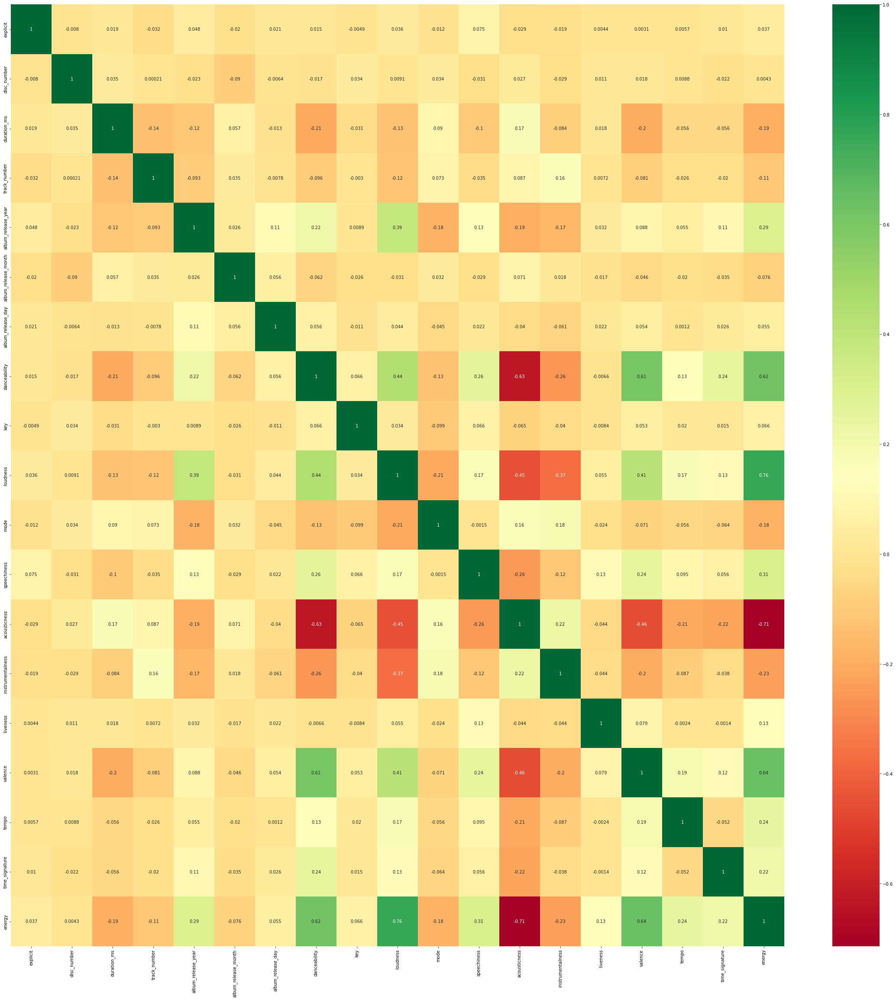

In [303]:
corrmat = Data.corr()
plt.figure(figsize = (40,40))
Data[corrmat.index]
g = sns.heatmap(Data[corrmat.index].corr(), annot = True, cmap ="RdYlGn")

In [304]:
Data

,explicit,mode_name,artist_name,key_name,disc_number,duration_ms,track_number,album_release_year,album_release_month,album_release_day,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,energy
0,False,minor,Salar Aghili,C,1,446880,1,2020,2,3,...,-7.170,0,0.0299,0.839,0.000035,0.1360,0.3300,131.913,3,0.390
1,False,major,Salar Aghili,F,1,851920,2,2020,2,3,...,-10.008,1,0.0414,0.970,0.000360,0.0812,0.3460,105.634,4,0.146
2,False,minor,Salar Aghili,F,1,293160,3,2020,2,3,...,-5.392,0,0.0349,0.664,0.002070,0.1100,0.5010,94.651,5,0.453
3,False,minor,Salar Aghili,D,1,648720,4,2020,2,3,...,-12.287,0,0.0451,0.915,0.006580,0.2120,0.4450,110.967,5,0.138
4,False,minor,Salar Aghili,C,1,273480,5,2020,2,3,...,-5.702,0,0.0334,0.657,0.000008,0.1200,0.4100,148.053,1,0.443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10627,False,minor,Shahram Nazeri,E,1,397505,19,1985,1,8,...,-10.805,0,0.0452,0.946,0.005460,0.3530,0.3960,146.591,5,0.499
10628,False,minor,Shahram Nazeri,F,1,3522173,1,2008,10,7,...,-17.538,0,0.0690,0.982,0.061400,0.6670,0.1610,72.379,3,0.163
10629,False,major,Shahram Nazeri,G#,1,3402706,1,2008,10,7,...,-15.865,1,0.0350,0.883,0.019400,0.2630,0.1390,86.645,4,0.218
10630,False,major,Shahram Nazeri,G#,1,3342733,1,2008,10,7,...,-13.286,1,0.0369,0.842,0.223000,0.7980,0.2100,77.819,3,0.304


Spliting to x and y values

In [305]:
x = Data.iloc[:, :-1].values
y = Data.iloc[:, -1].values

In [306]:
print(x)
print(y)

[[False 'minor' 'Salar Aghili' 'C' 1 446880 1 2020 2 3 0.437 0 -7.17 0
  0.0299 0.839 3.51e-05 0.136 0.33 131.913 3]
 [False 'major' 'Salar Aghili' 'F' 1 851920 2 2020 2 3 0.379 5 -10.008 1
  0.0414 0.97 0.00036 0.0812 0.346 105.634 4]
 [False 'minor' 'Salar Aghili' 'F' 1 293160 3 2020 2 3 0.437 5 -5.392 0
  0.0349 0.664 0.00207 0.11 0.501 94.651 5]
 [False 'minor' 'Salar Aghili' 'D' 1 648720 4 2020 2 3 0.488 2 -12.287 0
  0.0451 0.915 0.00658 0.212 0.445 110.967 5]
 [False 'minor' 'Salar Aghili' 'C' 1 273480 5 2020 2 3 0.301 0 -5.702 0
  0.0334 0.657 8.47e-06 0.12 0.41 148.053 1]
 [False 'minor' 'Salar Aghili' 'C' 1 260754 1 2019 10 30 0.577 0 -6.668 0
  0.0368 0.834 3.94e-06 0.111 0.367 77.453 3]
 [False 'minor' 'Salar Aghili' 'F#' 1 250827 2 2019 10 30 0.389 6 -8.491
  0 0.0329 0.905 0.000353 0.0955 0.193 108.016 4]
 [False 'minor' 'Salar Aghili' 'A' 1 627226 3 2019 10 30 0.329 9 -12.627
  0 0.0361 0.905 0.00169 0.107 0.171 92.121 3]
 [False 'minor' 'Salar Aghili' 'A' 1 280111 4 201

- No missing values we've already taken care of it, therefor no imputer
- Encoding categoricals which are independent variables
- No need to encode depenedent variable cz 'energy' is already numerical
- Set a binary value for 'artist_name'
- set OneHotEncoder for others

In [307]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
x[:,2] = le.fit_transform(x[:,2])
ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [0,1,3,4])], remainder='passthrough')
x = np.array(ct.fit_transform(x))


In [308]:
np.set_printoptions(threshold = np.inf)
print(x)

[[1.0 0.0 0.0 1.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 58 446880 1 2020 2 3 0.437 0 -7.17 0 0.0299 0.839 3.51e-05
  0.136 0.33 131.913 3]
 [1.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 58 851920 2 2020 2 3 0.379 5 -10.008 1 0.0414 0.97 0.00036
  0.0812 0.346 105.634 4]
 [1.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 58 293160 3 2020 2 3 0.437 5 -5.392 0 0.0349 0.664 0.00207 0.11
  0.501 94.651 5]
 [1.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 58 648720 4 2020 2 3 0.488 2 -12.287 0 0.0451 0.915 0.00658
  0.212 0.445 110.967 5]
 [1.0 0.0 0.0 1.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 58 273480 5 2020 2 3 0.301 0 -5.702 0 0.0334 0.657 8.47e-06
  0.12 0.41 148.053 1]
 [1.0 0.0 0.0 1.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 58 260754 1 2019 10 30 0.577 0 -6.668 0 0.0368 0.834 3.94e-06
  0.111 0.367 77

Split into train and test

In [309]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 98)

In [310]:
print(x_train)
print(x_test)
print(y_train)
print(y_test)

[[1.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 1.0 0.0
  0.0 0.0 6 382613 1 2019 4 7 0.389 6 -10.96 0 0.0992 0.947 0.00363 0.731
  0.375 111.101 3]
 [1.0 0.0 0.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 5 248533 6 2008 1 28 0.51 9 -13.478 0 0.0425 0.822 7.93e-05
  0.136 0.5 151.88 4]
 [1.0 0.0 1.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 46 961533 8 1977 8 18 0.308 10 -10.064 1 0.0498 0.99 0.00133
  0.0902 0.335 57.933 4]
 [1.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 50 142666 2 2005 6 9 0.515 1 -8.086 1 0.106 0.524 0.0 0.108
  0.833 195.381 3]
 [1.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 0.0
  0.0 0.0 29 57373 2 1993 6 19 0.421 8 -16.688 1 0.0337 0.624 0.663 0.11
  0.437 84.098 4]
 [1.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 1.0 0.0
  0.0 0.0 56 220827 1 2019 8 8 0.808 7 -8.485 0 0.0469 0.906 5.44e-06
  0.107 0.758 119.945 4]


Feature scaling with standardisation
Scale numerical data

In [311]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train[:, -16:] = sc.fit_transform(x_train[:, -16:])
x_test[:, -16:] = sc.transform(x_test[:, -16:])

In [312]:
print(x_train)
print(x_test)
print(y_train)
print(y_test)

[[1.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 1.0 0.0
  0.0 0.0 6 0.541765366004602 -1.004818492530276 1.1573346874709913
  -0.6812786844571981 -0.7393065977274882 -0.7060290928682306
  0.2203682581528874 -0.18984017510420237 -0.7702553916090151
  0.41060387870355525 1.0568176472791047 -0.43491389500036337
  3.516702895274028 -0.31473282088201715 -0.2808226977922845
  -1.0467040553772915]
 [1.0 0.0 0.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 5 -0.23998992761672122 0.09505039794205318 -0.1089738675246705
  -1.5550070400201739 1.659615243144522 -0.0023385579018426242
  1.0466277889054107 -0.7384947739012483 -0.7702553916090151
  -0.38057322983251923 0.6637680241875671 -0.4474372776014803
  -0.36600933440388717 0.20919062542268263 1.0831628596047673
  0.5244604329714312]
 [1.0 0.0 1.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0
  0.0 0.0 46 3.9171664294238773 0.5349979541309848 -3.6776616134215354
  0.48369245629343643 0.51

Train with random forest cz it is the most powerfull model in regression and works good on labeled features (like artist_name)

In [313]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 10, random_state = 0)
regressor.fit(x_train, y_train)

RandomForestRegressor(n_estimators=10, random_state=0)

Predict

In [314]:
y_pred = regressor.predict(x_test)
np.set_printoptions(precision=4)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[0.7754 0.867 ]
 [0.4455 0.311 ]
 [0.2605 0.262 ]
 [0.7113 0.679 ]
 [0.4506 0.362 ]
 [0.4909 0.473 ]
 [0.6638 0.47  ]
 [0.601  0.52  ]
 [0.7972 0.775 ]
 [0.6127 0.621 ]
 [0.6995 0.586 ]
 [0.7179 0.684 ]
 [0.6124 0.652 ]
 [0.2637 0.414 ]
 [0.357  0.385 ]
 [0.8446 0.887 ]
 [0.4782 0.402 ]
 [0.1423 0.124 ]
 [0.6425 0.62  ]
 [0.1995 0.13  ]
 [0.2912 0.25  ]
 [0.558  0.517 ]
 [0.497  0.497 ]
 [0.787  0.783 ]
 [0.7489 0.698 ]
 [0.5979 0.59  ]
 [0.8055 0.816 ]
 [0.511  0.511 ]
 [0.5526 0.522 ]
 [0.2201 0.355 ]
 [0.3609 0.263 ]
 [0.2936 0.113 ]
 [0.6725 0.655 ]
 [0.3076 0.317 ]
 [0.6223 0.682 ]
 [0.5187 0.512 ]
 [0.4131 0.358 ]
 [0.7081 0.644 ]
 [0.2509 0.233 ]
 [0.501  0.386 ]
 [0.2179 0.135 ]
 [0.6541 0.774 ]
 [0.2054 0.271 ]
 [0.3344 0.61  ]
 [0.5347 0.536 ]
 [0.1809 0.19  ]
 [0.2352 0.238 ]
 [0.7397 0.586 ]
 [0.6035 0.61  ]
 [0.3884 0.405 ]
 [0.1582 0.204 ]
 [0.2907 0.314 ]
 [0.668  0.731 ]
 [0.6257 0.687 ]
 [0.2375 0.17  ]
 [0.5319 0.588 ]
 [0.7003 0.703 ]
 [0.6477 0.65  ]
 [0.7662 0.861

+ Evaluation with confusion, I have cut whole y_pred and y_test to 5 periods
+ It will give us 5*5 confusion matrix the we will calculate TN,TP,FN,FP for each 5 periods
+ I consider 5 cuts cz it has proper period length

In [315]:
import copy
cuts = 5
tmp = []
for i in y_pred:
  tmp.append(i)
for i in y_test:
  tmp.append(i)
cat ,qdf = pd.cut(tmp, cuts, precision = 13, retbins=True)

print("Cuts : ", qdf)

tmp = []
for i in range(cuts):
  tmp.append(0)
confusion_matrix = []
for i in range(cuts):
  confusion_matrix.append(copy.deepcopy(tmp))

for i in range(len(y_pred)):
  done = False
  for p in range(len(qdf)-1):
    for q in range(len(qdf)-1):
      if (qdf[p] < y_pred[i] <= qdf[p+1]) and (qdf[q] < y_test[i] <= qdf[q+1]):
        confusion_matrix[q][p] += 1
        done = True
        break
    if done:
      break

print("Confusion Matrix")
for i in confusion_matrix:
  print(i)

Cuts :  [0.0088 0.207  0.4042 0.6015 0.7987 0.996 ]
Confusion Matrix
[199, 79, 1, 0, 0]
[47, 383, 100, 2, 0]
[2, 81, 363, 65, 3]
[0, 12, 98, 345, 36]
[0, 0, 10, 104, 197]


Confusion Matrix

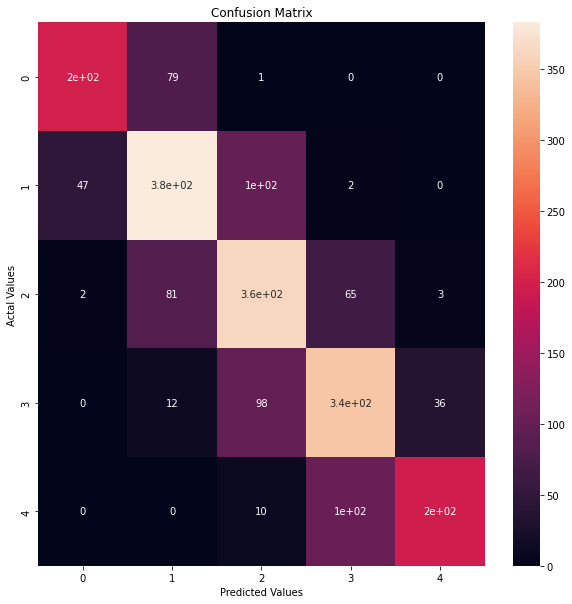

In [316]:
plt.figure(figsize=(10,10))
sns.heatmap(confusion_matrix, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

Obtain TN,TP,FN,FP from Confusion Matrix

In [317]:
TP = {}
TN = {}
FN = {}
FP = {}
for i in range(cuts):
  TP[i] = confusion_matrix[i][i]
  TN[i] = 0
  FN[i] = 0
  FP[i] = 0
  for j in range(cuts):
    if j != i:
      FN[i] += confusion_matrix[i][j]
  for j in range(cuts):
    if j != i:
      FP[i] += confusion_matrix[j][i]
  for j in range(cuts):
    for z in range(cuts):
      if z != i and j != i:
        TN[i] += confusion_matrix[j][z]

Print TN,TP,FN,FP for each cut

In [318]:
for i in range(cuts):
  print("Cut number: ",i+1)
  print("TP : ",TP[i])
  print("TN : ",TN[i])
  print("FN : ",FN[i])
  print("FP : ",FP[i])

Cut number:  1
TP :  199
TN :  1799
FN :  80
FP :  49
Cut number:  2
TP :  383
TN :  1423
FN :  149
FP :  172
Cut number:  3
TP :  363
TN :  1404
FN :  151
FP :  209
Cut number:  4
TP :  345
TN :  1465
FN :  146
FP :  171
Cut number:  5
TP :  197
TN :  1777
FN :  114
FP :  39


Accuracy

In [319]:
print("Accuracy : ")
total = 0
for i in range(cuts):
  print("Cut number: ",i+1)
  total += (TP[i]+TN[i])/len(y_test)
  print((TP[i]+TN[i])/len(y_test))
print("Total : ",total/cuts)

Accuracy : 
Cut number:  1
0.9393511988716502
Cut number:  2
0.849083215796897
Cut number:  3
0.8307475317348378
Cut number:  4
0.8509637987776211
Cut number:  5
0.9280677009873061
Total :  0.8796426892336624


Precision

In [320]:
print("Precision : ")
total = 0
for i in range(cuts):
  print("Cut number: ",i+1)
  if TP[i] == 0:
    print(0)
  else:
    print((TP[i])/(TP[i] + FP[i]))
    total += (TP[i])/(TP[i] + FP[i])
print("Total : ",total/cuts)

Precision : 
Cut number:  1
0.8024193548387096
Cut number:  2
0.69009009009009
Cut number:  3
0.6346153846153846
Cut number:  4
0.6686046511627907
Cut number:  5
0.8347457627118644
Total :  0.7260950486837678


Recall

In [321]:
print("Recall : ")
total = 0
for i in range(cuts):
  print("Cut number: ",i+1)
  if TP[i] == 0:
    print(0)
  else:
    print((TP[i])/(TP[i] + FN[i]))
    total += (TP[i])/(TP[i] + FN[i])
print("Total : ",total/cuts)

Recall : 
Cut number:  1
0.7132616487455197
Cut number:  2
0.7199248120300752
Cut number:  3
0.7062256809338522
Cut number:  4
0.7026476578411406
Cut number:  5
0.6334405144694534
Total :  0.6951000628040082


Start DL with importing tensorflow

In [322]:
import tensorflow as tf
tf.__version__

'2.11.0'

Split into test and train

In [323]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 98)

Standardization on whole data not only numerical ( it is necessary for DL )

In [324]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

Initialization

In [325]:
model = tf.keras.models.Sequential()

Input layer

In [326]:
model.add(tf.keras.layers.Dense(units = 22, input_dim = 37, activation = "relu"))

Hidden layer

In [327]:
model.add(tf.keras.layers.Dense(units = 10, activation = "relu"))
model.add(tf.keras.layers.Dense(units = 10, activation = "tanh"))
model.add(tf.keras.layers.Dense(units = 10, activation = "relu"))

Output layer

In [328]:
model.add(tf.keras.layers.Dense(units = 1, activation = "sigmoid"))

Compile and fit

In [329]:
model.compile(optimizer = 'adam', loss = 'mse', metrics = ['MAE','mse'])
history = model.fit(x_train, y_train, batch_size = 8, epochs = 50)

Epoch 1/50
1064/1064 [==============================] - 2s 1ms/step - loss: 0.0162 - MAE: 0.0979 - mse: 0.0162
Epoch 2/50
1064/1064 [==============================] - 1s 1ms/step - loss: 0.0097 - MAE: 0.0772 - mse: 0.0097
Epoch 3/50
1064/1064 [==============================] - 1s 1ms/step - loss: 0.0089 - MAE: 0.0735 - mse: 0.0089
Epoch 4/50
1064/1064 [==============================] - 1s 1ms/step - loss: 0.0085 - MAE: 0.0718 - mse: 0.0085
Epoch 5/50
1064/1064 [==============================] - 1s 1ms/step - loss: 0.0082 - MAE: 0.0706 - mse: 0.0082
Epoch 6/50
1064/1064 [==============================] - 1s 1ms/step - loss: 0.0080 - MAE: 0.0695 - mse: 0.0080
Epoch 7/50
1064/1064 [==============================] - 1s 1ms/step - loss: 0.0079 - MAE: 0.0688 - mse: 0.0079
Epoch 8/50
1064/1064 [==============================] - 1s 1ms/step - loss: 0.0078 - MAE: 0.0685 - mse: 0.0078
Epoch 9/50
1064/1064 [==============================] - 1s 1ms/step - loss: 0.0077 - MAE: 0.0678 - mse: 0.0077
E

In [330]:
score = model.evaluate(x_test, y_test, verbose=0)
print(score)

[0.009615836665034294, 0.07434631884098053, 0.009615836665034294]


Predict Test

In [331]:
y_pred = model.predict(x_test)

67/67 [==============================] - 0s 1ms/step


Epoch - MAE and loss

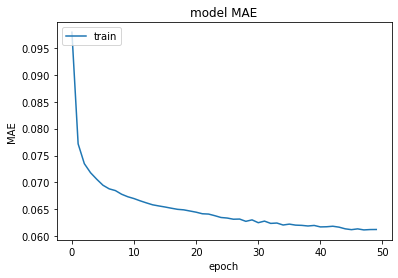

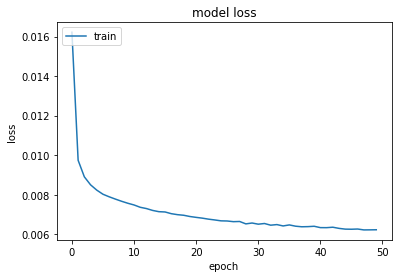

In [332]:
plt.plot(history.history['MAE'])
plt.title('model MAE')
plt.ylabel('MAE')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()

Calculate confusion

In [342]:
cuts = 5
tmp = []
for i in y_pred:
  tmp.append(i)
for i in y_test:
  tmp.append(i)
cat ,qdf = pd.cut(tmp, cuts, precision = 13, retbins=True)

print("Cuts : ", qdf)

tmp = []
for i in range(cuts):
  tmp.append(0)
confusion_matrix = []
for i in range(cuts):
  confusion_matrix.append(copy.deepcopy(tmp))

for i in range(len(y_pred)):
  done = False
  for p in range(len(qdf)-1):
    for q in range(len(qdf)-1):
      if (qdf[p] < y_pred[i] <= qdf[p+1]) and (qdf[q] < y_test[i] <= qdf[q+1]):
        confusion_matrix[q][p] += 1
        done = True
        break
    if done:
      break

print("Confusion Matrix")
for i in confusion_matrix:
  print(i)

Cuts :  [0.0088 0.207  0.4042 0.6015 0.7987 0.996 ]
Confusion Matrix
[204, 75, 0, 0, 0]
[79, 355, 97, 1, 0]
[3, 99, 302, 107, 3]
[1, 10, 100, 320, 60]
[0, 1, 14, 137, 159]


Confusion Matrix

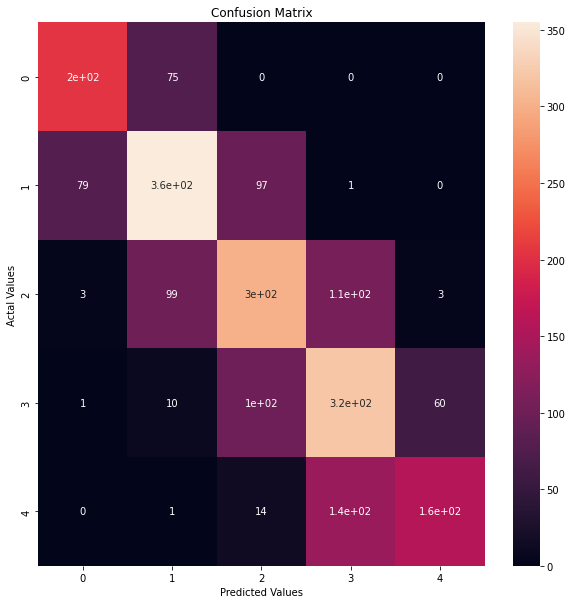

In [343]:
plt.figure(figsize=(10,10))
sns.heatmap(confusion_matrix, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

Calculate TP,TN,FN,FP

In [344]:
TP = {}
TN = {}
FN = {}
FP = {}
for i in range(cuts):
  TP[i] = confusion_matrix[i][i]
  TN[i] = 0
  FN[i] = 0
  FP[i] = 0
  for j in range(cuts):
    if j != i:
      FN[i] += confusion_matrix[i][j]
  for j in range(cuts):
    if j != i:
      FP[i] += confusion_matrix[j][i]
  for j in range(cuts):
    for z in range(cuts):
      if z != i and j != i:
        TN[i] += confusion_matrix[j][z]

for i in range(cuts):
  print("Cut number: ",i+1)
  print("TP : ",TP[i])
  print("TN : ",TN[i])
  print("FN : ",FN[i])
  print("FP : ",FP[i])

Cut number:  1
TP :  204
TN :  1765
FN :  75
FP :  83
Cut number:  2
TP :  355
TN :  1410
FN :  177
FP :  185
Cut number:  3
TP :  302
TN :  1402
FN :  212
FP :  211
Cut number:  4
TP :  320
TN :  1391
FN :  171
FP :  245
Cut number:  5
TP :  159
TN :  1753
FN :  152
FP :  63


Accuracy

In [345]:
print("Accuracy : ")
total = 0
for i in range(cuts):
  print("Cut number: ",i+1)
  total += (TP[i]+TN[i])/len(y_test)
  print((TP[i]+TN[i])/len(y_test))
print("Total : ",total/cuts)

Accuracy : 
Cut number:  1
0.925716972261401
Cut number:  2
0.8298072402444758
Cut number:  3
0.8011283497884344
Cut number:  4
0.8044193700047014
Cut number:  5
0.8989186647860837
Total :  0.8519981194170192


Precision

In [346]:
print("Precision : ")
total = 0
for i in range(cuts):
  print("Cut number: ",i+1)
  if TP[i] == 0:
    print(0)
  else:
    print((TP[i])/(TP[i] + FP[i]))
    total += (TP[i])/(TP[i] + FP[i])
print("Total : ",total/cuts)

Precision : 
Cut number:  1
0.710801393728223
Cut number:  2
0.6574074074074074
Cut number:  3
0.5886939571150097
Cut number:  4
0.5663716814159292
Cut number:  5
0.7162162162162162
Total :  0.647898131176557


Recall

In [347]:
print("Recall : ")
total = 0
for i in range(cuts):
  print("Cut number: ",i+1)
  if TP[i] == 0:
    print(0)
  else:
    print((TP[i])/(TP[i] + FN[i]))
    total += (TP[i])/(TP[i] + FN[i])
print("Total : ",total/cuts)

Recall : 
Cut number:  1
0.7311827956989247
Cut number:  2
0.6672932330827067
Cut number:  3
0.5875486381322957
Cut number:  4
0.6517311608961304
Cut number:  5
0.5112540192926045
Total :  0.6298019694205325
